In [1]:
# NOTE FOR LOCAL EXECUTION: use pytorch kernel and execute the code below to specify cuda device
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

# BERT and Explainable AI

## Load required libraries

In [2]:
!pip install pandas
!pip install transformers
!pip install transformers-interpret

## Import libraries

In [1]:
from utils import *
import pandas as pd
import pickle
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import SequenceClassificationExplainer

c:\Users\david.gallardo\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\mbti\masked\IE\utils.py:10: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  auc_metric = load_metric("roc_auc", trust_remote_code=True)


## Load data

In [2]:
# Original data
#df = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\essays.csv", encoding = "latin-1")

# Alternatively, load fragmented validation and test partitions
df_train = pd.read_csv(r"C:\Users\david.gallardo\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_train.csv")
df_valid = pd.read_csv(r"C:\Users\david.gallardo\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_valid.csv")
df_test = pd.read_csv(r"C:\Users\david.gallardo\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_test.csv")
#df = pd.concat([df_valid, df_test], axis=0, ignore_index=True)
df = df_test

df.head()

,type,text,I/E,N/S,F/T,J/P,masked_text_bert,num_replacements,masked_text_roberta,random_masked_text_bert,random_masked_text_roberta
0,INFP,"they sleep, but yeah. How long do you think yo...",1,1,1,0,"they sleep, but yeah. How long do you think yo...",0,"they sleep, but yeah. How long do you think yo...","they sleep, but yeah. How long do you think yo...","they sleep, but yeah. How long do you think yo..."
1,INFJ,conflict earlier today in school. I stood up f...,1,1,1,1,conflict earlier today in school. I stood up f...,0,conflict earlier today in school. I stood up f...,conflict earlier today in school. I stood [UNK...,conflict earlier today in school. I stood up f...
2,INTJ,is the interesting one. Assume that everyone i...,1,1,0,1,is the interesting one. Assume that everyone i...,0,is the interesting one. Assume that everyone i...,is the interesting one. Assume that everyone i...,is the interesting one. Assume that everyone i...
3,INFJ,experience and now I'm forever traumatized.|||...,1,1,1,1,experience and now I'm forever traumatized.|||...,1,experience and now I'm forever traumatized.|||...,experience and now I'm forever traumatized.|||...,experience and now I'm forever traumatized.|||...
4,ENTP,I can respect that. I'd take an INFP any day o...,0,1,0,0,I can respect that. I'd take an [UNK] any day ...,8,I can respect that. I'd take an <unk> any day ...,I can respect that. I'd take an INFP any day o...,I can respect that. I'd take an INFP <unk> day...


In [5]:
print(len(df))

4416


## Notebook Settings

In [3]:
trait = "I/E"
text_colname="masked_text_bert"

## Load the fine-tuned model

In [4]:
# Path to the fine-tuned model
#model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\Agreeableness\results_agreeableness"  # my laptop
model_path = r"C:\Users\david.gallardo\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\fine_tuning_models\results_masked_mbti_ie_fragm_256"

# Load the fine-tuned model and tokenizer
model_name = "bert-base-uncased"
#model_name = "FacebookAI/roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name, do_lower_case=True)
#tokenizer = getTokenizer(model_name)
fine_tuned_model = AutoModelForSequenceClassification.from_pretrained(model_path)
cls_explainer = SequenceClassificationExplainer(fine_tuned_model, tokenizer)

  0%|          | 0/552 [00:00<?, ?it/s]

{'eval_loss': 0.6194584965705872, 'eval_accuracy': 0.7640398550724637, 'eval_roc_auc': 0.5955450521704097, 'eval_conf_matrix': array([[ 288,  761],
       [ 281, 3086]], dtype=int64), 'eval_runtime': 266.8499, 'eval_samples_per_second': 16.549, 'eval_steps_per_second': 2.069}


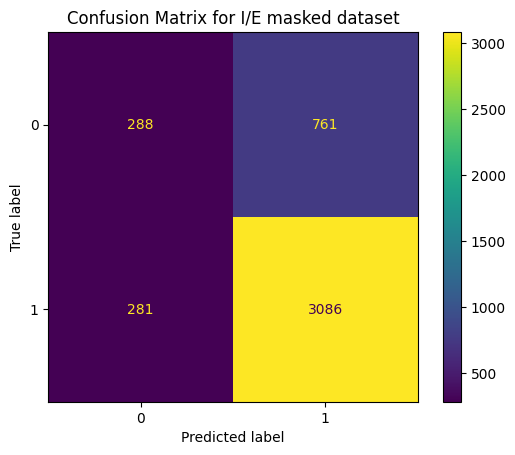

In [6]:
# Check that the models works correctly

# Create datasets
X_train, X_valid, y_train, y_valid = create_partition_from_split(df_train, df_valid, text_colname, trait)
_, X_test, _, y_test = create_partition_from_split(df_train, df_test, text_colname, trait)
train_dataset, valid_dataset = create_datasets(tokenizer, X_train, X_valid, y_train, y_valid)
_, test_dataset = create_datasets(tokenizer, X_train, X_test, y_train, y_test)

# Create trainer
trainer = Trainer(
        model=fine_tuned_model,          # the instantiated Transformers model to be trained
        args=None,                       # training arguments
        train_dataset=train_dataset,     # training dataset
        eval_dataset=test_dataset,      # evaluation dataset
        compute_metrics=compute_metrics, # the callback that computes metrics of interest
        #optimizers=(optimizer, None)
    )

results = trainer.evaluate()
conf_matrix = results['eval_conf_matrix']
print(results)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()

# Add a title to the confusion matrix plot
plt.title("Confusion Matrix for I/E masked dataset")
plt.show()

In [9]:
import pickle

# Set the desired maximum sequence length
max_sequence_length = 450
attribution_threshold = 0.8 # Adjust the threshold as needed

# List to store word attributions for each row
all_word_attributions = []

# List to store sum of attributions for each row
all_sum_attributions = []

# Loop through all rows in the dataset
print("Number of rows:", len(df))
for row_index in range(len(df)):
    # Show progress every 100 sentences
    if row_index%100 == 0:
        print(row_index)
        
    preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                    max_sequence_length, text_colname=text_colname)
    word_attributions = cls_explainer(preproc_text)
    true_class = df.loc[row_index, trait]
    predicted_class = cls_explainer.predicted_class_name

    # Print the terms with scores greater than the threshold
    for token, score in word_attributions:
        if abs(score) > attribution_threshold:
            print(f'Token: {token}, Score: {score}')

    # Save the filtered attributions for this row along with true_class and predicted_class
    attribution_info = (word_attributions, true_class, predicted_class)
    all_word_attributions.append(attribution_info)

    # Visualize if there are filtered attributions
    if any(abs(score) > attribution_threshold for _, score in word_attributions):
        cls_explainer.visualize(true_class=true_class)
    
    # Sum of attributions for the entire text
    sum_attribution = cls_explainer.attributions.attributions_sum.sum()

    # Save the sum of attributions for this row
    all_sum_attributions.append((sum_attribution.item(), true_class, predicted_class))
    
# Save all_word_attributions to a file
word_attr_fname = get_all_word_attr_fname_masked_mbti(trait)
with open(word_attr_fname, 'wb') as file:
    pickle.dump(all_word_attributions, file)

# Save all_sum_attributions to a file
sum_attr_fname = get_all_sum_attr_fname_masked_mbti(trait)
with open(sum_attr_fname, 'wb') as file:
    pickle.dump(all_sum_attributions, file)

Number of rows: 4416
0
Token: artist, Score: 0.8358454040715623


Token: perfection, Score: 0.8216212521831002


Token: librarian, Score: 0.8178188261392183


100
Token: wealth, Score: 0.8408873992853693


Token: jung, Score: 0.8937525021341565


Token: romance, Score: -0.8053996892454726


200
Token: scientists, Score: 0.8699726128022223


Token: games, Score: 0.8044371048584052


Token indices sequence length is longer than the specified maximum sequence length for this model (516 > 512). Running this sequence through the model will result in indexing errors


Token: perfection, Score: 0.9152545903819799


Token: personality, Score: -0.8145984671324197


300
Token: planetary, Score: 0.8070946025039387


Token: mb, Score: -0.8346397778842322


400
Token: vega, Score: 0.85942851877814


500
Token: the, Score: -0.8436571369428234


Token: society, Score: 0.8235851045040642


600
Token: animals, Score: 0.8065932573218995


Token: music, Score: 0.8010987823127282


Token: awesome, Score: -0.8181818729616098


700
Token: architect, Score: 0.9124330964260003


800
Token: dust, Score: 0.802816515950488


900
Token: dreaming, Score: 0.9005940209766202


Token: for, Score: 0.8378655119577617


1000
Token: pokemon, Score: 0.9076676135828576


1100
Token: charming, Score: -0.8688300685106088


1200
1300
Token: dreamer, Score: 0.8478602989187846


Token: healer, Score: 0.864557444353121


1400
Token: musician, Score: 0.9055994426831219


Token: aesthetics, Score: 0.8219627053818198


1500
1600
Token: library, Score: 0.8389334173044938


1700
Token: buffy, Score: 0.8132630360194639


1800
1900
Token: oblivion, Score: 0.8749997118209984


Token: writings, Score: 0.8528827890041942


Token: burnt, Score: 0.8945289972869755


2000
Token: nara, Score: 0.8288176418315597


2100
Token: healer, Score: 0.852169562692167


2200
Token: ideological, Score: -0.8435374279710014


Token: romantic, Score: -0.8768833964040832


2300
2400
Token: kind, Score: 0.8349227012479248


Token: abdullah, Score: 0.8304451390529309


2500
2600
Token: sexy, Score: 0.9418972620960752


Token: poverty, Score: 0.9426441363988275


Token: religions, Score: 0.9026901455341786


2700
Token: nietzsche, Score: 0.8061004684532961


2800
Token: ballet, Score: 0.8957578631173784


2900
Token: casinos, Score: 0.8488295785471859


Token: lullaby, Score: 0.8524646521352435


Token: sports, Score: 0.8265752375425974


3000
Token: perfection, Score: 0.8257328304458509


3100
Token: dirt, Score: 0.8281221228330018


Token: music, Score: 0.8373219418969231


3200
Token: hooked, Score: 0.8779204453383818


Token: samurai, Score: 0.8133018853144477


3300
Token: enthusiastic, Score: -0.8670188586530274


Token: jerry, Score: 0.8192806485362387


Token: ', Score: 0.8462939105106785


Token: ##girl, Score: -0.8128475557017284


3400
Token: destiny, Score: 0.8309616671575052


Token: harmony, Score: 0.891799313207561


Token: humanity, Score: 0.885775311776064


Token: cafe, Score: -0.8874097865940394


3500
Token: dogs, Score: 0.844538573599711


3600
3700
Token: debate, Score: 0.8087356739331711


Token: library, Score: 0.8242780599353756


Token: [UNK], Score: -0.805023779960409


Token: for, Score: 0.8438530461579535


Token: champion, Score: -0.8359408133872137


Token: cheat, Score: -0.8154529778301571


Token: culinary, Score: -0.8117881010346951


Token: bicycles, Score: 0.855598155809579


3800
Token: meeting, Score: -0.8109921875410381


3900
Token: happy, Score: 0.8125053959002113


Token: dreaming, Score: 0.800990149221099


Token: ##29, Score: 0.8241997713264152


Token: ##5, Score: 0.8201589097152816


4000
Token: survey, Score: 0.8309606494132984


Token: earth, Score: 0.8158136751748188


4100
Token: mural, Score: 0.8306022105352737


4200
Token: forum, Score: -0.8101553358321779


Token: aesthetics, Score: 0.9145952579883447


4300
4400


In [5]:
import pickle

word_attr_fname = get_all_word_attr_fname_masked_mbti(trait)
sum_attr_fname = get_all_sum_attr_fname_masked_mbti(trait)

# Load the previously saved attributions from the file
with open(word_attr_fname, 'rb') as file:
    all_word_attributions = pickle.load(file)

# Load the previously saved attributions from the file
with open(sum_attr_fname, 'rb') as file:
    all_sum_attributions = pickle.load(file)

## Obtain Word Frequencies 

In [6]:
word_freq = get_word_freqs(all_word_attributions)
word_freq_label_1 = get_word_freqs(all_word_attributions, "LABEL_1")
word_freq_label_0 = get_word_freqs(all_word_attributions, "LABEL_0")

## Obtain Positive and Negative Attributions

In [7]:
# Get positive and negative attributions for the two labels
force_correct_classif=False
positive_attributions_label_1 = filter_attributions(all_word_attributions, '+', "LABEL_1", force_correct_classif)
positive_attributions_label_0 = filter_attributions(all_word_attributions, '+', "LABEL_0", force_correct_classif)
negative_attributions_label_1 = filter_attributions(all_word_attributions, '-', "LABEL_1", force_correct_classif)
negative_attributions_label_0 = filter_attributions(all_word_attributions, '-', "LABEL_0", force_correct_classif)

## Word Filtering Functions

In [8]:
#!pip install nltk

import nltk
from nltk.corpus import stopwords

# Obtain stop words
nltk.download('stopwords')
english_stopwords = stopwords.words('english')
#print(english_stopwords)

# Obtain list of words
nltk.download('words')
english_words = set(nltk.corpus.words.words())
#print(len(english_words))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\david.gallardo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\david.gallardo\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Word Clouds
### By attribution score

In [10]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt

min_word_freq = 10
min_word_len = 2
sum_techniques = ["freq", "avg", "max", "accum", "gmean"]
#sum_techniques = ["avg"]
#english_words=None
for sum_technique in sum_techniques:

    # Create separate lists for positive and negative attributions for LABEL_1
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len, mbti_words)
    positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len, mbti_words)
    negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

    # Create separate lists for positive and negative attributions for LABEL_0
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len, mbti_words)
    positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len, mbti_words)
    negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

    # Generate word clouds
    wordcloud_label_1_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_1)
    wordcloud_label_1_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_1)
    wordcloud_label_0_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_0)
    wordcloud_label_0_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_0)

    # Plot word clouds
    fig = plt.figure(figsize=(16, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(wordcloud_label_1_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(wordcloud_label_1_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(wordcloud_label_0_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(wordcloud_label_0_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.tight_layout()
    
    # Save the figure as a high-resolution image
    filename = f"wordclouds_IE_{sum_technique}.png"
    plt.savefig(filename, dpi=300, bbox_inches = "tight")
    plt.close(fig)

## Barplots

In [11]:
min_word_freq = 10
min_word_len = 2
sum_technique = "gmean"
# Create separate lists for positive and negative attributions for LABEL_1
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len, mbti_words)
positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len, mbti_words)
negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

# Create separate lists for positive and negative attributions for LABEL_0
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len, mbti_words)
positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len, mbti_words)
negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

# Plot horizontal bar plots for each category with both top and bottom significant words
plot_bar(positive_words_label_1, 'Positive Attributions (LABEL_1)', filename = "positive_label_1_barplot.png")
plot_bar(negative_words_label_1, 'Negative Attributions (LABEL_1)', filename = "negative_label_1_barplot.png")
plot_bar(positive_words_label_0, 'Positive Attributions (LABEL_0)', filename = "positive_label_0_barplot.png")
plot_bar(negative_words_label_0, 'Negative Attributions (LABEL_0)', filename = "negative_label_0_barplot.png")

Saved positive_label_1_barplot.png
Saved negative_label_1_barplot.png
Saved positive_label_0_barplot.png
Saved negative_label_0_barplot.png


## Histogram

In [ ]:
import matplotlib.pyplot as plt

# Create a histogram
filtered_sum_attributions = filter_sum_attributions(all_sum_attributions)
plt.hist(filtered_sum_attributions, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Sum of Attributions Scores')
plt.xlabel('Sum of Attributions Scores')
plt.ylabel('Frequency')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create histograms
for pred_class in [None, "LABEL_1", "LABEL_0"]:
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class)
    hist, bins, _ = plt.hist(sum_attributions, bins=20, color='blue', alpha=0.7)
    plt.title('Histogram of Sum of Attributions Scores, pred_class=' + str(pred_class))
    plt.xlabel('Sum of Attributions Scores')
    plt.ylabel('Frequency')

    # Calculate the percentiles
    percentiles = np.percentile(sum_attributions, [25, 50, 75])

    # Print the percentile values
    for percentile_value in percentiles:
        print("Percentile value:", percentile_value)

    # Draw red lines at the percentile values
    for percentile_value in percentiles:
        plt.axvline(percentile_value, color='red', linestyle='--')

    plt.show()

## Texts: highest scores

In [ ]:
import numpy as np

# Set the desired maximum sequence length
max_sequence_length = 450

# Calculate the percentiles
# percentiles = np.percentile(all_total_attributions, [25, 75])

# Set the attribution threshold as the first and third percentile values
# attribution_threshold_lower = percentiles[0]
# attribution_threshold_upper = percentiles[1]

attribution_threshold_lower = -1.2264066739414712
attribution_threshold_upper = 3.9756553009835245

# Loop through all rows in the dataset
for row_index in range(len(df)):
    # Sum of attributions for the entire text
    sum_attribution = all_sum_attributions[row_index][0]

    # Check if the total attribution falls within the specified thresholds
    if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
        
        # Save the filtered attributions for this row
        attribution_info = (sum_attribution, true_class, predicted_class)

        # Print the information only for rows meeting the threshold
        print(f'True Class for Row {row_index}: {true_class}')
        print(f'Total Attribution for Row {row_index}: {sum_attribution}')

        # Visualize if needed
        if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
            cls_explainer.visualize(true_class=true_class)

## Visualize sorted lists (explainer)

In [ ]:
# Set the desired maximum sequence length
max_sequence_length = 450

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        print(all_sum_attributions[row_index], sum_attribution)

        # Visualize the attributions for the text
        cls_explainer.visualize(true_class=true_class)

## Trial

In [ ]:
# Define a function to get the HTML file name
def get_html_fname(pred_class):
    return 'attributions_' + pred_class + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Initialize the HTML content
html_content = "<html><head><title>Posts with highest scores</title></head><body>"

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        # Add the information to the HTML content
        html_content += f"<p>{all_sum_attributions[row_index]}, {sum_attribution}</p>"

        # Visualize the attributions for the text
        explanation_html = cls_explainer.visualize(true_class=true_class).data

        # Add the text to the HTML content
        html_content += str(explanation_html)

    # Close the HTML content
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname(pred_class)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

    # Reset the HTML content for the next pred_class
    html_content = "<html><body>"

## Visualize sentences with a particular word (sum attribution ordering)

In [12]:
def get_html_fname_mbti(word_of_interest):
    return 'avg_post_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Define the list of words of interest and other parameters
words_of_interest = ["story", "annoying", "ideal", "win", "family"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get filtered sum attributions
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class_of_interest, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    num_elem = 0
    for element in sorted_list:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        if score is not None:
            # Extract row information
            preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
            word_attributions = cls_explainer(preproc_text)
            true_class = df.loc[row_index, trait]
            predicted_class = cls_explainer.predicted_class_name
            
            # Print score
            print(word_of_interest, "score:", score)

            # Visualize and collect HTML content
            explanation_html = cls_explainer.visualize(true_class=true_class).data
            html_content += f"<h3>{word_of_interest} score: {score}</h3>"
            html_content += str(explanation_html)  # Ensure conversion to string
            
            num_elem += 1
            if num_elem == max_elements_to_show:
                break

    # Close the HTML content
    html_content += "</body></html>"

    # Close the HTML file name
    html_fname = get_html_fname_mbti(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

story score: 0.017519296716396453


story score: 0.05793815663361308


story score: 0.14723817151046628


story score: 0.07977029433742128


story score: 0.08494927419347113


story score: 0.016605747912497894


story score: -0.04113756089738027


story score: 0.038761490600245176


story score: -0.04192322817211613


story score: -0.02377735758261615


annoying score: -0.041829778344568656


annoying score: -0.03771105946889855


annoying score: -0.02037605340515438


annoying score: -0.010264367904904478


annoying score: -0.05363358811161724


annoying score: -0.06992755868315945


annoying score: 0.3669919043726105


annoying score: -0.02011577404378779


annoying score: -0.05696794887387472


annoying score: -0.05799298274736649


ideal score: 0.11853364522630881


ideal score: -0.11875086569902682


ideal score: 0.052200870244504274


ideal score: 0.0315376345343529


ideal score: 0.3411889618202812


ideal score: 0.03291522152216473


ideal score: 0.12530985988235663


ideal score: 0.011547310179438178


ideal score: -0.013282554051645567


ideal score: 0.07165157861845649


win score: 0.04151440031591074


win score: 0.016428240152642805


win score: -0.0940418194744452


win score: 0.012324603324305952


win score: 0.06343701107725809


win score: 0.014143798565109169


win score: -0.021469152733166904


win score: 0.3173283871430392


family score: -0.056158547518787766


family score: -0.051234060065591856


family score: -0.08346204140680603


family score: -0.011989710362509285


family score: -0.036922771406990074


family score: -0.09763071670041448


family score: -0.027349969784153307


family score: -0.0023884060032620977


family score: 0.01665166383824326


family score: 0.008542472253096029


## Visualize sentences with a particular word (word attribution ordering)

In [13]:
def get_html_fname_mbti(word_of_interest):
    return 'avg_word_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Define the list of words of interest and other parameters
words_of_interest = ["story", "annoying", "ideal", "win", "family"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get word score info
    word_scores = get_max_word_scores(word_of_interest, all_word_attributions, pred_class_of_interest)

    # Sort word scores
    sorted_list = sorted(word_scores, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    for element in sorted_list[:max_elements_to_show]:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
            
        # Print score
        print(word_of_interest, "score:", score)

        # Visualize and collect HTML content
        explanation_html = cls_explainer.visualize(true_class=true_class).data
        html_content += f"<h3>{word_of_interest} score: {score}</h3>"
        html_content += explanation_html

    # Close HTML content string
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname_mbti(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

story score: 0.42499834504506856


story score: 0.26570142748288283


story score: 0.17686315515137405


story score: 0.14723817151046628


story score: 0.10186187613286679


story score: 0.08494927419347113


story score: 0.07977029433742128


story score: 0.0782628868107071


story score: 0.0649746257857869


story score: 0.057989325203247975


annoying score: 0.4159161661586472


annoying score: 0.3669919043726105


annoying score: 0.06562835783164332


annoying score: 0.044591813252561605


annoying score: -0.010264367904904478


annoying score: -0.016022787989995537


annoying score: -0.02011577404378779


annoying score: -0.02037605340515438


annoying score: -0.02451172570992104


annoying score: -0.03771105946889855


ideal score: 0.3411889618202812


ideal score: 0.1609407663761373


ideal score: 0.16002152949625106


ideal score: 0.15459223409322953


ideal score: 0.12530985988235663


ideal score: 0.11853364522630881


ideal score: 0.0877612307388005


ideal score: 0.08354318607393281


ideal score: 0.07165157861845649


ideal score: 0.05963832056344753


win score: 0.3173283871430392


win score: 0.06343701107725809


win score: 0.04151440031591074


win score: 0.016428240152642805


win score: 0.014143798565109169


win score: 0.012324603324305952


win score: -0.021469152733166904


win score: -0.0940418194744452


family score: 0.30331526295148376


family score: 0.07106053333301807


family score: 0.03635427191627652


family score: 0.02604710476149395


family score: 0.02529648990923084


family score: 0.01665166383824326


family score: 0.014700274820142488


family score: 0.008542472253096029


family score: 0.0067089794972140515


family score: 0.0015998701141298735
